# Elephant image classification 

This data downloaded from kaggel website this data is all about we have to predict that wether the elephant is belog to asia are africa based on the analysis 

Importing necassary librarys 

In [71]:
import tensorflow as tf # used to work with deep learning techniques 
from tensorflow.keras import datasets,layers,models
import matplotlib.pyplot as plt # used for visulization 
import numpy as np # to work with arrays 
import pandas as pd # to work with the data set 
import seaborn as sns # for visulization 
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator # for data agumentation 
from tensorflow.keras.layers import Conv2D # it is use dfor convolution operation 
from tensorflow.keras.layers import Dense # it is using for add the nodes fot hidden layers 

In [37]:
# code is use to implement  to use maximum 50 percent GPU memory 
from tensorflow.compat.v1 import ConfigProto,InteractiveSession
config = ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [40]:
# data peprocessing # preprocessing the training data set 
train_data = ImageDataGenerator(rescale=1./255,shear_range=0.2
                                ,zoom_range=0.2,horizontal_flip=True)

In [72]:
# readding the training data set 
train_set = train_data.flow_from_directory("C:\\Users\\LFO\\Downloads\\archive (1)\\dataset\\train",target_size=(200,200),
                                          batch_size=3,class_mode='binary')
# test data 
test_datagen = ImageDataGenerator(rescale=1./255)
test_set = test_datagen.flow_from_directory("C:\\Users\\LFO\\Downloads\\archive (1)\dataset\\test",
                                          target_size=(200,200),
                                          batch_size=3,class_mode='binary')

Found 840 images belonging to 2 classes.
Found 187 images belonging to 2 classes.


In [73]:
train_set.class_indices

{'African': 0, 'Asian': 1}

# Implementing with kernel regularizer for svm

In [92]:
# it is an main thing where adding function to runs in svm model 
from tensorflow.keras.regularizers import l2
cnn = tf.keras.models.Sequential() # creating an cnn layer

# 1st convolutionlayer
cnn.add(tf.keras.layers.Conv2D(filters=32,padding="same",kernel_size=3,activation="relu",strides=2,input_shape=[200,200,3]))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2)) # adding 2Dpooling layers becasues it is not a 3 d images  

# 2nd convolutionlayer
cnn.add(tf.keras.layers.Conv2D(filters=64,padding="same",kernel_size=3,activation="relu",strides=2))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2)) # pooling the layers 

# adding flatteng layers
cnn.add(tf.keras.layers.Flatten())

# adding fully connected layers 
cnn.add(tf.keras.layers.Dense(units=128,activation="relu"))

# output layer
# this is themain thing where gives the difference between normal cnn to svm model by adding kernal_regulazier and 
# giving activation as liner and this this is an binary classification i am using the linear suppose it was softmax kernal
cnn.add(Dense(1, kernel_regularizer=tf.keras.regularizers.l2(0.01),activation
             ='linear'))

In [93]:
# checking the entire information of cnn 
cnn.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 100, 100, 32)      896       
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 50, 50, 32)        0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 25, 25, 32)        9248      
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 12, 12, 32)        0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 4608)              0         
_________________________________________________________________
dense_15 (Dense)             (None, 128)               589952    
_________________________________________________________________
dense_16 (Dense)             (None, 1)               

# adding an hinge in loss for svm

In [94]:
# Training the CNN 3 by adding hing it converts to the svm model
cnn.compile(optimizer="adam",loss='hinge',metrics=['accuracy'])

# training the CNN on the training set and evaluating it on the test data 
r = cnn.fit(x=train_set,validation_data=test_set,epochs=10) # runing with 10 epchs 

Epoch 1/10
280/280 [==============================] - 118s 414ms/step - loss: 1.0047 - accuracy: 0.5155 - val_loss: 1.0029 - val_accuracy: 0.5134
Epoch 2/10
280/280 [==============================] - 101s 362ms/step - loss: 1.0067 - accuracy: 0.5000 - val_loss: 1.0036 - val_accuracy: 0.5134
Epoch 3/10
280/280 [==============================] - 99s 353ms/step - loss: 1.0135 - accuracy: 0.4976 - val_loss: 0.9931 - val_accuracy: 0.5134
Epoch 4/10
280/280 [==============================] - 101s 360ms/step - loss: 1.0020 - accuracy: 0.4988 - val_loss: 0.9815 - val_accuracy: 0.4973
Epoch 5/10
280/280 [==============================] - 99s 355ms/step - loss: 0.9458 - accuracy: 0.5274 - val_loss: 0.7620 - val_accuracy: 0.6364
Epoch 6/10
280/280 [==============================] - 103s 369ms/step - loss: 0.9095 - accuracy: 0.5476 - val_loss: 0.9485 - val_accuracy: 0.5455
Epoch 7/10
280/280 [==============================] - 99s 353ms/step - loss: 0.8962 - accuracy: 0.5643 - val_loss: 0.7759 - va

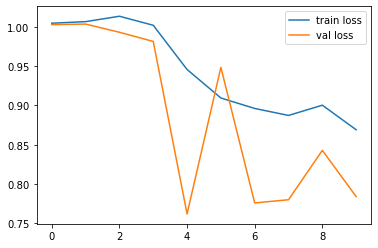

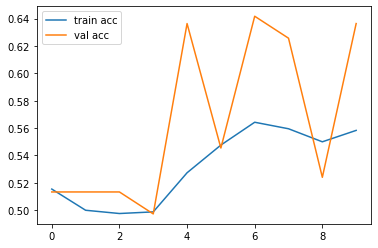

<Figure size 432x288 with 0 Axes>

In [95]:
# ploting the loss
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(r.history['accuracy'], label='train acc')
plt.plot(r.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

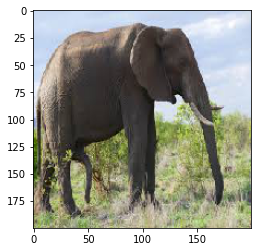

Asian elephant


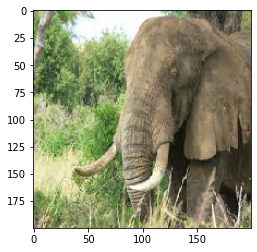

Asian elephant


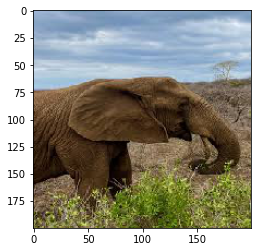

Asian elephant


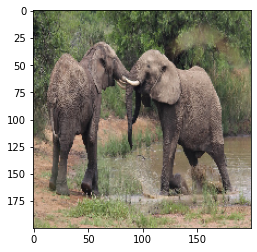

Asian elephant


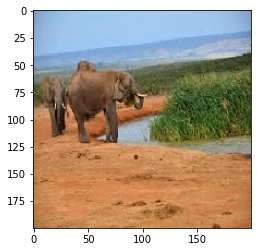

Asian elephant


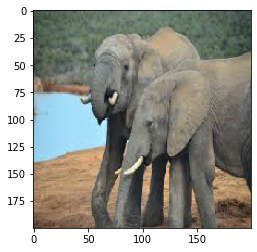

Asian elephant


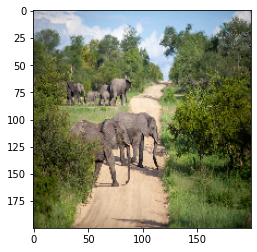

Asian elephant


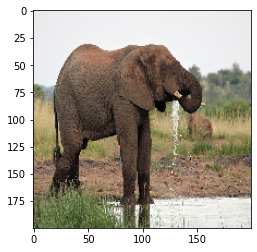

Asian elephant


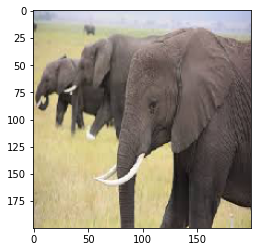

Asian elephant


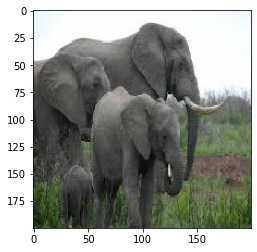

Asian elephant


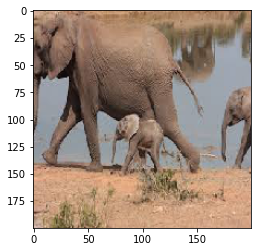

Asian elephant


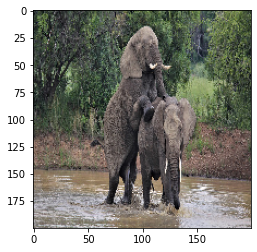

Asian elephant


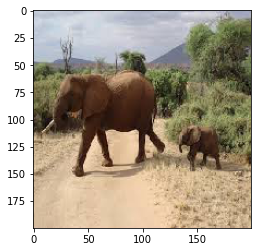

Asian elephant


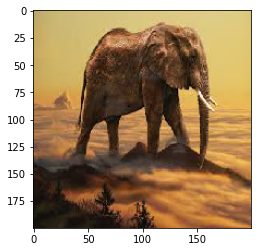

Asian elephant


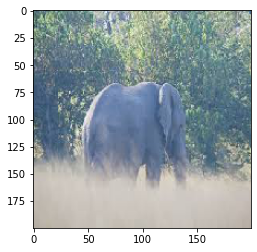

Asian elephant


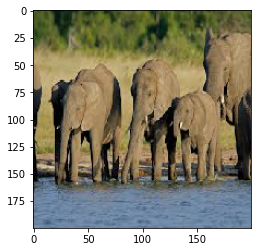

Asian elephant


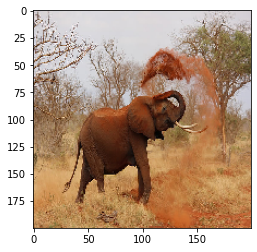

Asian elephant


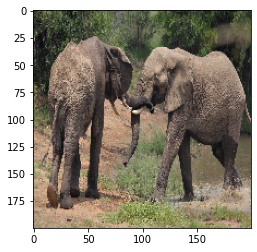

Asian elephant


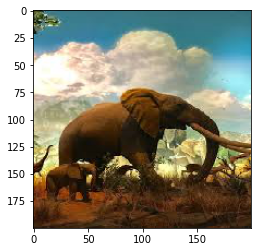

Asian elephant


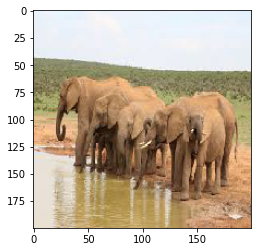

Asian elephant


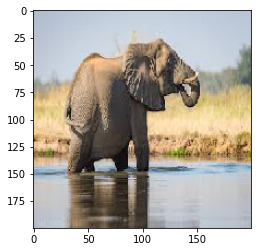

Asian elephant


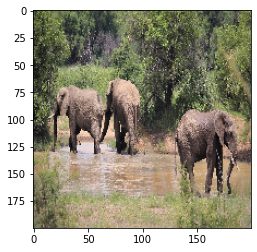

Asian elephant


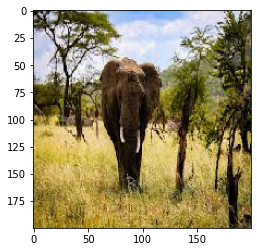

Asian elephant


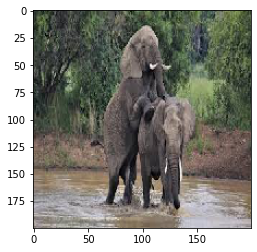

Asian elephant


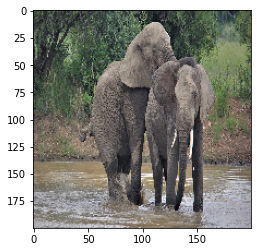

Asian elephant


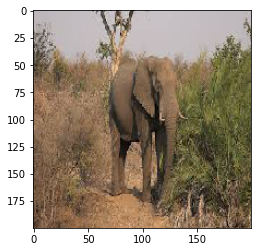

Asian elephant


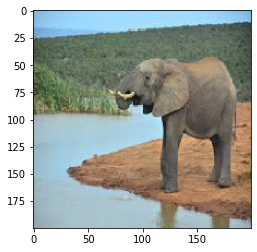

Asian elephant


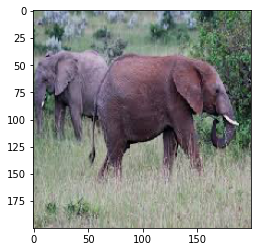

Asian elephant


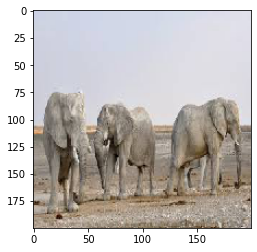

Asian elephant


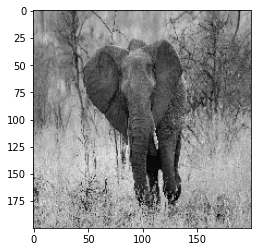

Asian elephant


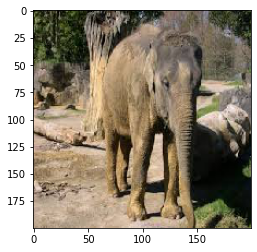

Asian elephant


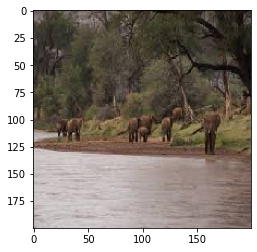

Asian elephant


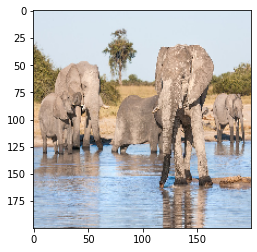

Asian elephant


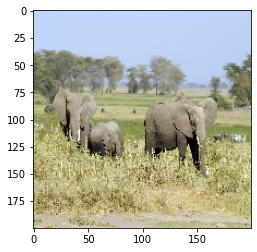

Asian elephant


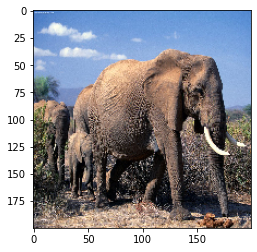

Asian elephant


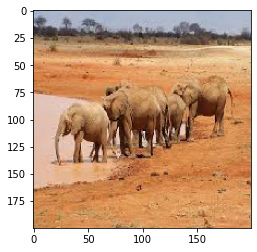

Asian elephant


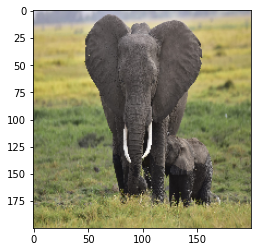

Asian elephant


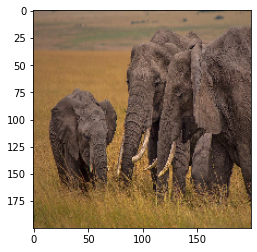

Asian elephant


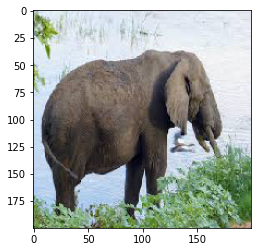

Asian elephant


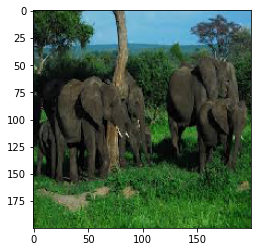

Asian elephant


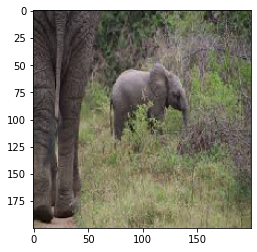

Asian elephant


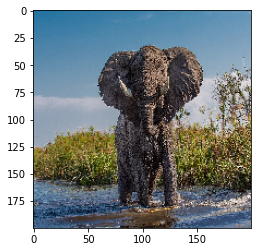

Asian elephant


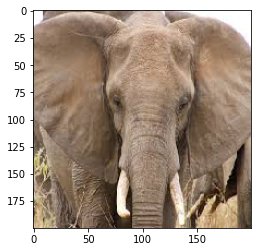

Asian elephant


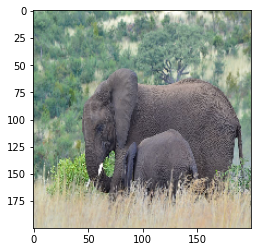

Asian elephant


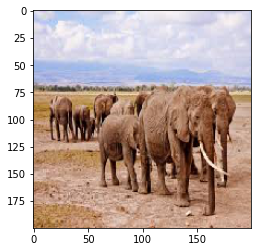

Asian elephant


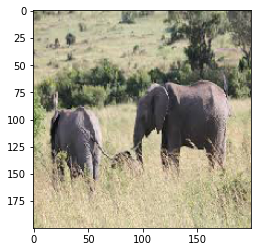

Asian elephant


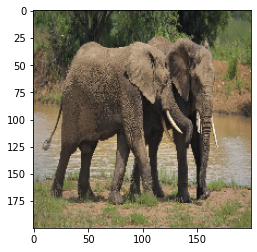

Asian elephant


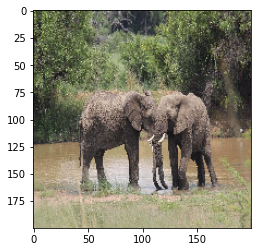

Asian elephant


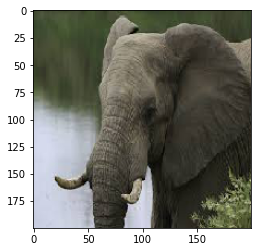

Asian elephant


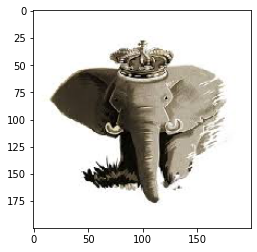

Asian elephant


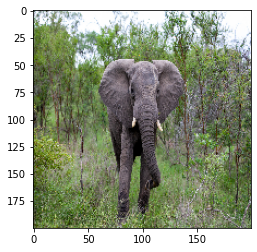

Asian elephant


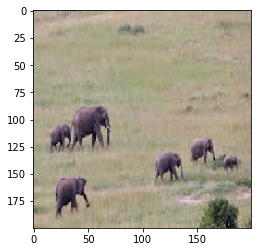

Asian elephant


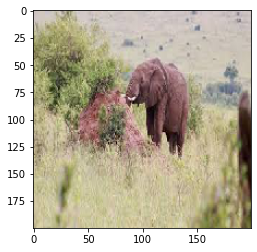

Asian elephant


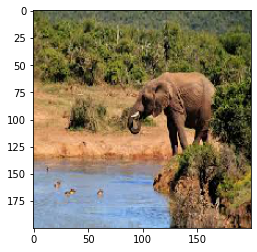

Asian elephant


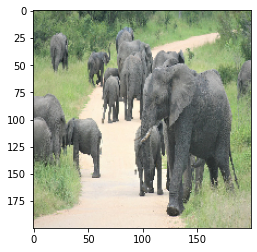

Asian elephant


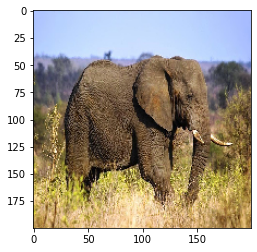

Asian elephant


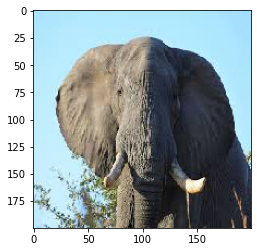

Asian elephant


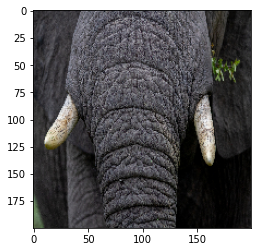

Asian elephant


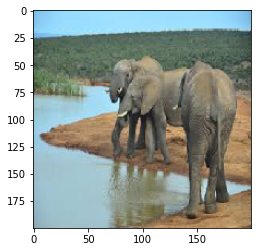

Asian elephant


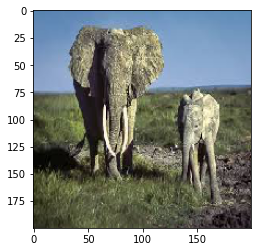

Asian elephant


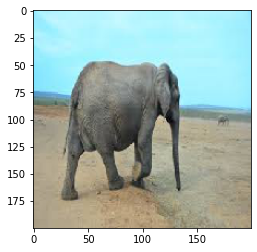

Asian elephant


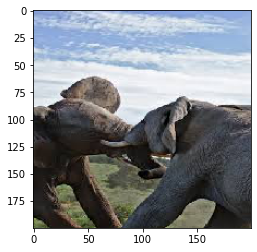

Asian elephant


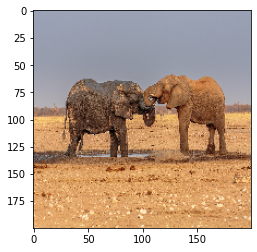

Asian elephant


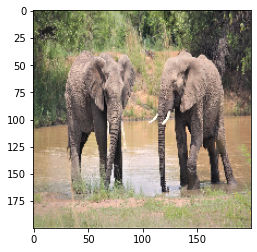

Asian elephant


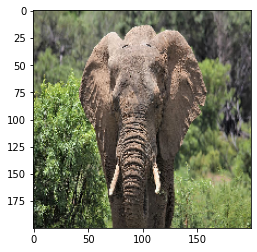

Asian elephant


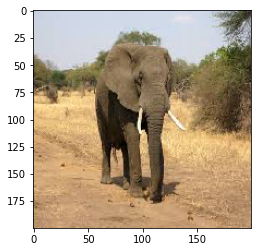

Asian elephant


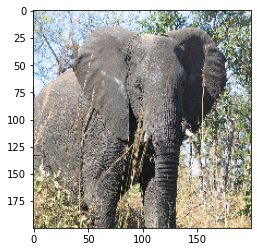

Asian elephant


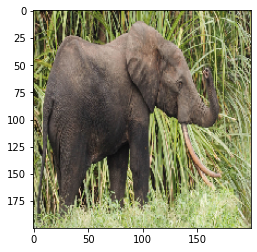

Asian elephant


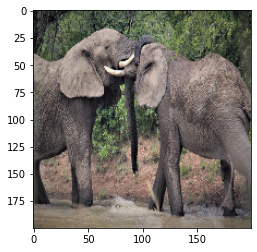

Asian elephant


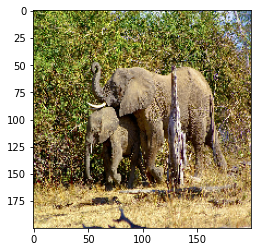

Asian elephant


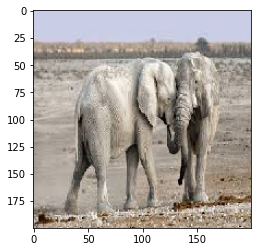

Asian elephant


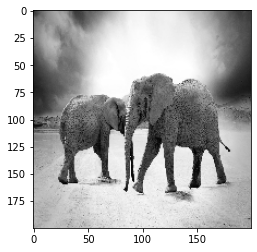

Asian elephant


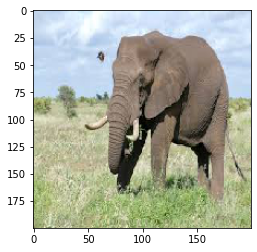

Asian elephant


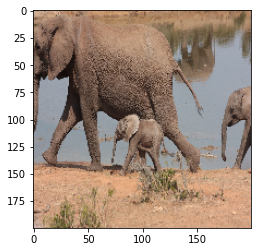

Asian elephant


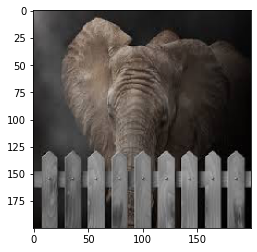

Asian elephant


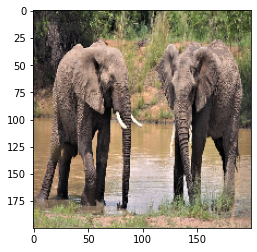

Asian elephant


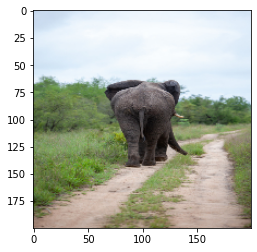

Asian elephant


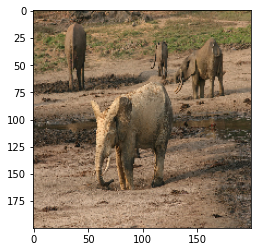

Asian elephant


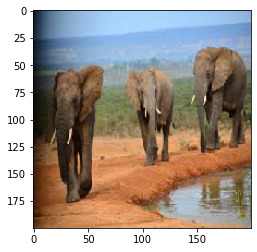

Asian elephant


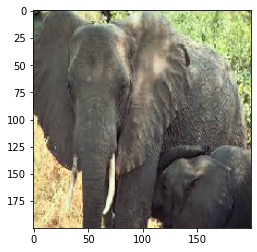

Asian elephant


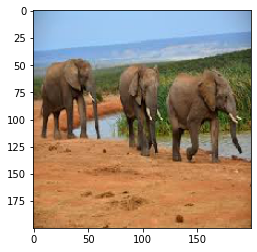

Asian elephant


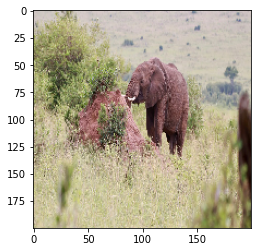

Asian elephant


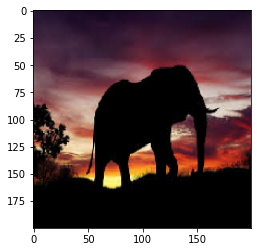

Asian elephant


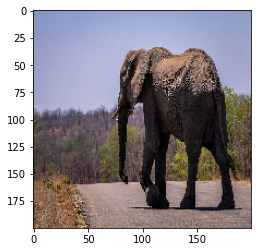

Asian elephant


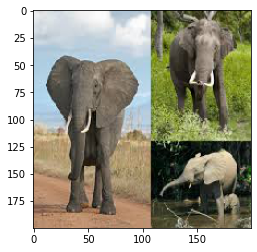

Asian elephant


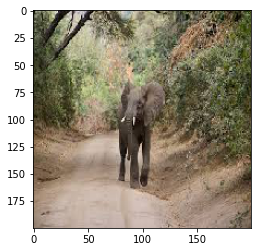

Asian elephant


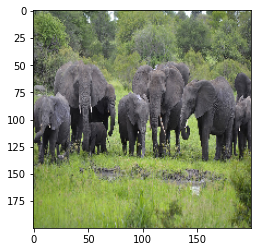

Asian elephant


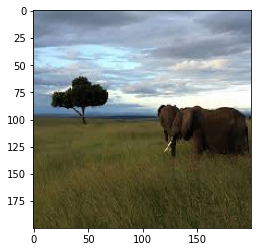

Asian elephant


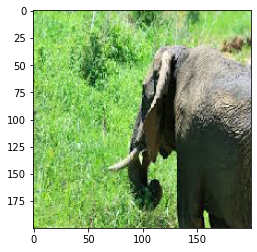

Asian elephant


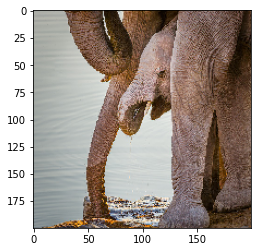

Asian elephant


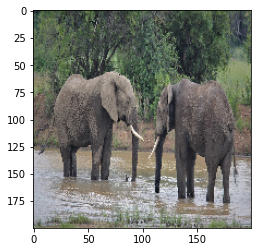

Asian elephant


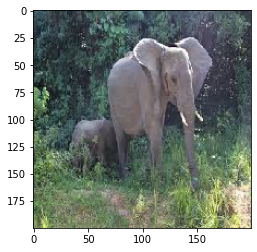

Asian elephant


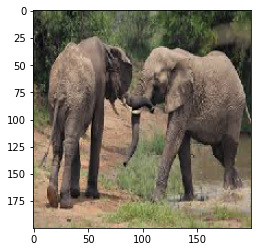

Asian elephant


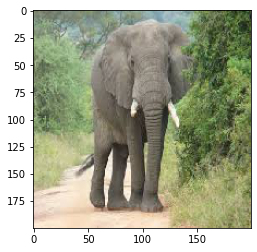

Asian elephant


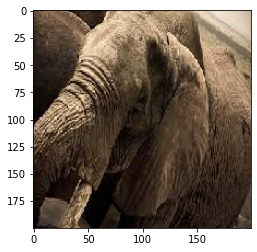

Asian elephant


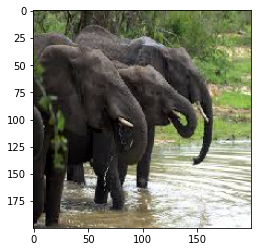

Asian elephant


In [96]:
# visulizing the image one by on and identifing the whether it an african are asian elephant 
dir_path = "C:\\Users\\LFO\\Downloads\\archive (1)\dataset\\test\\African"
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    # converting the images into array 
    x = image.img_to_array(img)
    x = np.expand_dims(x,axis=0)
    images = np.vstack([x])
    val = cnn.predict(images)
    if val==0:
        print("Afican elephant")
    else:
        print("Asian elephant")
    